In [21]:
import keras
keras.__version__
import cv2

# Neural style transfer


This notebook contains the code samples found in Chapter 8, Section 3 of [Deep Learning with Python](https://www.manning.com/books/deep-learning-with-python?a_aid=keras&a_bid=76564dff). Note that the original text features far more content, in particular further explanations and figures: in this notebook, you will only find source code and related comments.

----


Besides Deep Dream, another major development in deep learning-driven image modification that happened in the summer of 2015 is neural 
style transfer, introduced by Leon Gatys et al. The neural style transfer algorithm has undergone many refinements and spawned many 
variations since its original introduction, including a viral smartphone app, called Prisma. For simplicity, this section focuses on the 
formulation described in the original paper.

Neural style transfer consists in applying the "style" of a reference image to a target image, while conserving the "content" of the target 
image:



![style transfer](https://s3.amazonaws.com/book.keras.io/img/ch8/style_transfer.png)


What is meant by "style" is essentially textures, colors, and visual patterns in the image, at various spatial scales, while the "content" 
is the higher-level macrostructure of the image. For instance, blue-and-yellow circular brush strokes are considered to be the "style" in 
the above example using Starry Night by Van Gogh, while the buildings in the Tuebingen photograph are considered to be the "content".

The idea of style transfer, tightly related to that of texture generation, has had a long history in the image processing community prior 
to the development of neural style transfer in 2015. However, as it turned out, the deep learning-based implementations of style transfer 
offered results unparalleled by what could be previously achieved with classical computer vision techniques, and triggered an amazing 
renaissance in creative applications of computer vision.

The key notion behind implementing style transfer is same idea that is central to all deep learning algorithms: we define a loss function 
to specify what we want to achieve, and we minimize this loss. We know what we want to achieve: conserve the "content" of the original image, 
while adopting the "style" of the reference image. If we were able to mathematically define content and style, then an appropriate loss 
function to minimize would be the following:

```
loss = distance(style(reference_image) - style(generated_image)) +
       distance(content(original_image) - content(generated_image))
```


Where `distance` is a norm function such as the L2 norm, `content` is a function that takes an image and computes a representation of its 
"content", and `style` is a function that takes an image and computes a representation of its "style".

Minimizing this loss would cause `style(generated_image)` to be close to `style(reference_image)`, while `content(generated_image)` would 
be close to `content(generated_image)`, thus achieving style transfer as we defined it.

A fundamental observation made by Gatys et al is that deep convolutional neural networks offer precisely a way to mathematically defined 
the `style` and `content` functions. Let's see how.

## The content loss


As you already know, activations from earlier layers in a network contain _local_ information about the image, while activations from 
higher layers contain increasingly _global_ and _abstract_ information. Formulated in a different way, the activations of the different 
layers of a convnet provide a decomposition of the contents of an image over different spatial scales. Therefore we expect the "content" of 
an image, which is more global and more abstract, to be captured by the representations of a top layer of a convnet.

A good candidate for a content loss would thus be to consider a pre-trained convnet, and define as our loss the L2 norm between the 
activations of a top layer computed over the target image and the activations of the same layer computed over the generated image. This 
would guarantee that, as seen from the top layer of the convnet, the generated image will "look similar" to the original target image. 
Assuming that what the top layers of a convnet see is really the "content" of their input images, then this does work as a way to preserve 
image content.

## The style loss


While the content loss only leverages a single higher-up layer, the style loss as defined in the Gatys et al. paper leverages multiple 
layers of a convnet: we aim at capturing the appearance of the style reference image at all spatial scales extracted by the convnet, not 
just any single scale.

For the style loss, the Gatys et al. paper leverages the "Gram matrix" of a layer's activations, i.e. the inner product between the feature maps 
of a given layer. This inner product can be understood as representing a map of the correlations between the features of a layer. These 
feature correlations capture the statistics of the patterns of a particular spatial scale, which empirically corresponds to the appearance 
of the textures found at this scale.

Hence the style loss aims at preserving similar internal correlations within the activations of different layers, across the style 
reference image and the generated image. In turn, this guarantees that the textures found at different spatial scales will look similar 
across the style reference image and the generated image.

## In short


In short, we can use a pre-trained convnet to define a loss that will:

* Preserve content by maintaining similar high-level layer activations between the target content image and the generated image. The 
convnet should "see" both the target image and the generated image as "containing the same things".
* Preserve style by maintaining similar _correlations_ within activations for both low-level layers and high-level layers. Indeed, feature 
correlations capture _textures_: the generated and the style reference image should share the same textures at different spatial scales.

Now let's take a look at a Keras implementation of the original 2015 neural style transfer algorithm. As you will see, it shares a lot of 
similarities with the Deep Dream implementation we developed in the previous section.

## Neural style transfer in Keras


Neural style transfer can be implemented using any pre-trained convnet. Here we will use the VGG19 network, used by Gatys et al in their paper. 
VGG19 is a simple variant of the VGG16 network we introduced in Chapter 5, with three more convolutional layers.

This is our general process:

* Set up a network that will compute VGG19 layer activations for the style reference image, the target image, and the generated image at 
the same time.
* Use the layer activations computed over these three images to define the loss function described above, which we will minimize in order 
to achieve style transfer.
* Set up a gradient descent process to minimize this loss function.


Let's start by defining the paths to the two images we consider: the style reference image and the target image. To make sure that all 
images processed share similar sizes (widely different sizes would make style transfer more difficult), we will later resize them all to a 
shared height of 400px.

In [22]:
from keras.preprocessing.image import load_img, img_to_array

# This is the path to the image you want to transform.
target_image_path = 'human.jpg'
# This is the path to the style image.
style_reference_image_path = 'wall.jpg'

# Dimensions of the generated picture.
width, height = load_img(target_image_path).size
img_height = 612
img_width = int(width * img_height / height)

We will need some auxiliary functions for loading, pre-processing and post-processing the images that will go in and out of the VGG19 
convnet:

In [23]:
import numpy as np
from keras.applications import vgg19

def preprocess_image(image_path):
    img = load_img(image_path, target_size=(img_height, img_width))
    img = img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = vgg19.preprocess_input(img)
    return img

def deprocess_image(x):
    # Remove zero-center by mean pixel
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    # 'BGR'->'RGB'
    x = x[:, :, ::-1]
    x = np.clip(x, 0, 255).astype('uint8')
    return x


Let's set up the VGG19 network. It takes as input a batch of three images: the style reference image, the target image, and a placeholder 
that will contain the generated image. A placeholder is simply a symbolic tensor, the values of which are provided externally via Numpy 
arrays. The style reference and target image are static, and thus defined using `K.constant`, while the values contained in the placeholder 
of the generated image will change over time.

In [24]:
from keras import backend as K

target_image = K.constant(preprocess_image(target_image_path))
style_reference_image = K.constant(preprocess_image(style_reference_image_path))

# This placeholder will contain our generated image
combination_image = K.placeholder((1, img_height, img_width, 3))

# We combine the 3 images into a single batch
input_tensor = K.concatenate([target_image,
                              style_reference_image,
                              combination_image], axis=0)

# We build the VGG19 network with our batch of 3 images as input.
# The model will be loaded with pre-trained ImageNet weights.
model = vgg19.VGG19(input_tensor=input_tensor,
                    weights='imagenet',
                    include_top=False)
print('Model loaded.')

Model loaded.



Let's define the content loss, meant to make sure that the top layer of the VGG19 convnet will have a similar view of the target image and 
the generated image:

In [25]:
def content_loss(base, combination):
    return K.sum(K.square(combination - base))


Now, here's the style loss. It leverages an auxiliary function to compute the Gram matrix of an input matrix, i.e. a map of the correlations 
found in the original feature matrix.

In [26]:
def gram_matrix(x):
    features = K.batch_flatten(K.permute_dimensions(x, (2, 0, 1)))
    gram = K.dot(features, K.transpose(features))
    return gram


def style_loss(style, combination):
    S = gram_matrix(style)
    C = gram_matrix(combination)
    channels = 3
    size = img_height * img_width
    return K.sum(K.square(S - C)) / (4. * (channels ** 2) * (size ** 2))


To these two loss components, we add a third one, the "total variation loss". It is meant to encourage spatial continuity in the generated 
image, thus avoiding overly pixelated results. You could interpret it as a regularization loss.

In [27]:
def total_variation_loss(x):
    a = K.square(
        x[:, :img_height - 1, :img_width - 1, :] - x[:, 1:, :img_width - 1, :])
    b = K.square(
        x[:, :img_height - 1, :img_width - 1, :] - x[:, :img_height - 1, 1:, :])
    return K.sum(K.pow(a + b, 1.25))


The loss that we minimize is a weighted average of these three losses. To compute the content loss, we only leverage one top layer, the 
`block5_conv2` layer, while for the style loss we use a list of layers than spans both low-level and high-level layers. We add the total 
variation loss at the end.

Depending on the style reference image and content image you are using, you will likely want to tune the `content_weight` coefficient, the 
contribution of the content loss to the total loss. A higher `content_weight` means that the target content will be more recognizable in 
the generated image.

In [28]:
# Dict mapping layer names to activation tensors
outputs_dict = dict([(layer.name, layer.output) for layer in model.layers])
# Name of layer used for content loss
content_layer = 'block5_conv2'
# Name of layers used for style loss
style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1',
                'block4_conv1',
                'block5_conv1']
# Weights in the weighted average of the loss components
total_variation_weight = 1e-4
style_weight = 1.
# 0.025
content_weight = 0.005

# Define the loss by adding all components to a `loss` variable
loss = K.variable(0.)
layer_features = outputs_dict[content_layer]
target_image_features = layer_features[0, :, :, :]
combination_features = layer_features[2, :, :, :]
loss += content_weight * content_loss(target_image_features,
                                      combination_features)
for layer_name in style_layers:
    layer_features = outputs_dict[layer_name]
    style_reference_features = layer_features[1, :, :, :]
    combination_features = layer_features[2, :, :, :]
    sl = style_loss(style_reference_features, combination_features)
    loss += (style_weight / len(style_layers)) * sl
loss += total_variation_weight * total_variation_loss(combination_image)


Finally, we set up the gradient descent process. In the original Gatys et al. paper, optimization is performed using the L-BFGS algorithm, 
so that is also what we will use here. This is a key difference from the Deep Dream example in the previous section. The L-BFGS algorithms 
comes packaged with SciPy. However, there are two slight limitations with the SciPy implementation:

* It requires to be passed the value of the loss function and the value of the gradients as two separate functions.
* It can only be applied to flat vectors, whereas we have a 3D image array.

It would be very inefficient for us to compute the value of the loss function and the value of gradients independently, since it would lead 
to a lot of redundant computation between the two. We would be almost twice slower than we could be by computing them jointly. To by-pass 
this, we set up a Python class named `Evaluator` that will compute both loss value and gradients value at once, will return the loss value 
when called the first time, and will cache the gradients for the next call.

In [29]:
# Get the gradients of the generated image wrt the loss
grads = K.gradients(loss, combination_image)[0]

# Function to fetch the values of the current loss and the current gradients
fetch_loss_and_grads = K.function([combination_image], [loss, grads])


class Evaluator(object):

    def __init__(self):
        self.loss_value = None
        self.grads_values = None

    def loss(self, x):
        assert self.loss_value is None
        x = x.reshape((1, img_height, img_width, 3))
        outs = fetch_loss_and_grads([x])
        loss_value = outs[0]
        grad_values = outs[1].flatten().astype('float64')
        self.loss_value = loss_value
        self.grad_values = grad_values
        return self.loss_value

    def grads(self, x):
        assert self.loss_value is not None
        grad_values = np.copy(self.grad_values)
        self.loss_value = None
        self.grad_values = None
        return grad_values

evaluator = Evaluator()


Finally, we can run the gradient ascent process using SciPy's L-BFGS algorithm, saving the current generated image at each iteration of the 
algorithm (here, a single iteration represents 20 steps of gradient ascent):

Start of iteration 0
Current loss value: 1441418100.0


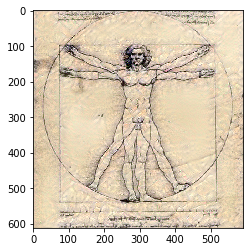

Image saved as style_transfer_result_at_iteration_0.png
Iteration 0 completed in 373s
Start of iteration 1
Current loss value: 642476200.0


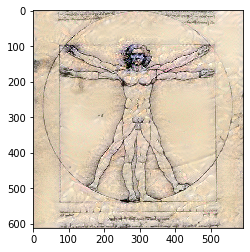

Image saved as style_transfer_result_at_iteration_1.png
Iteration 1 completed in 361s
Start of iteration 2
Current loss value: 419749760.0


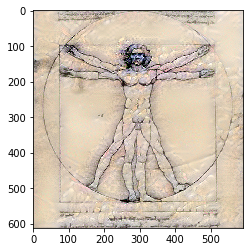

Image saved as style_transfer_result_at_iteration_2.png
Iteration 2 completed in 362s
Start of iteration 3
Current loss value: 321995800.0


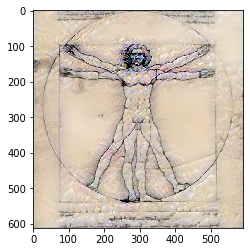

Image saved as style_transfer_result_at_iteration_3.png
Iteration 3 completed in 362s
Start of iteration 4
Current loss value: 263278820.0


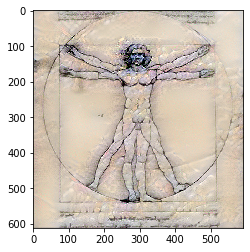

Image saved as style_transfer_result_at_iteration_4.png
Iteration 4 completed in 361s
Start of iteration 5
Current loss value: 223134740.0


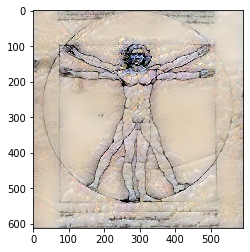

Image saved as style_transfer_result_at_iteration_5.png
Iteration 5 completed in 361s
Start of iteration 6
Current loss value: 194723550.0


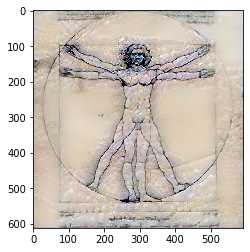

Image saved as style_transfer_result_at_iteration_6.png
Iteration 6 completed in 361s
Start of iteration 7
Current loss value: 173359760.0


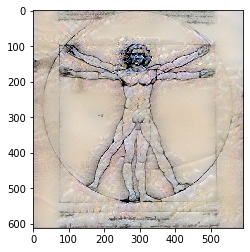

Image saved as style_transfer_result_at_iteration_7.png
Iteration 7 completed in 363s
Start of iteration 8
Current loss value: 156441860.0


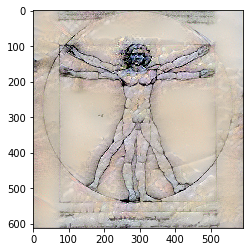

Image saved as style_transfer_result_at_iteration_8.png
Iteration 8 completed in 360s
Start of iteration 9
Current loss value: 142405070.0


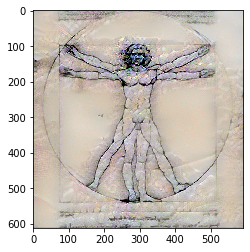

Image saved as style_transfer_result_at_iteration_9.png
Iteration 9 completed in 362s
Start of iteration 10
Current loss value: 131009350.0


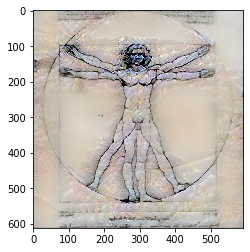

Image saved as style_transfer_result_at_iteration_10.png
Iteration 10 completed in 362s
Start of iteration 11
Current loss value: 121496540.0


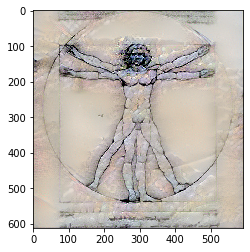

Image saved as style_transfer_result_at_iteration_11.png
Iteration 11 completed in 361s
Start of iteration 12
Current loss value: 113236584.0


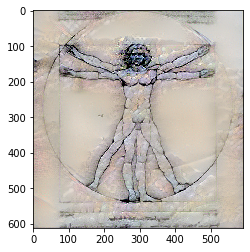

Image saved as style_transfer_result_at_iteration_12.png
Iteration 12 completed in 362s
Start of iteration 13
Current loss value: 106059256.0


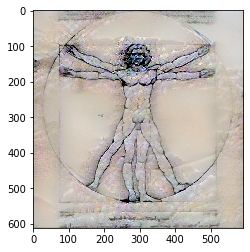

Image saved as style_transfer_result_at_iteration_13.png
Iteration 13 completed in 362s
Start of iteration 14
Current loss value: 99616200.0


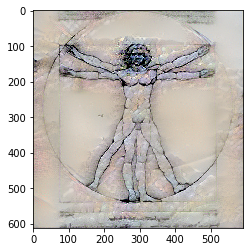

Image saved as style_transfer_result_at_iteration_14.png
Iteration 14 completed in 362s
Start of iteration 15
Current loss value: 93951460.0


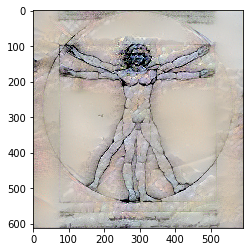

Image saved as style_transfer_result_at_iteration_15.png
Iteration 15 completed in 362s
Start of iteration 16
Current loss value: 88952136.0


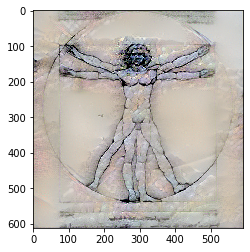

Image saved as style_transfer_result_at_iteration_16.png
Iteration 16 completed in 362s
Start of iteration 17
Current loss value: 84438200.0


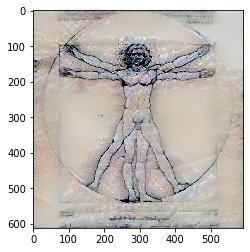

Image saved as style_transfer_result_at_iteration_17.png
Iteration 17 completed in 361s
Start of iteration 18
Current loss value: 80405310.0


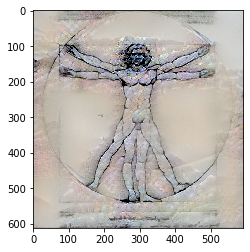

Image saved as style_transfer_result_at_iteration_18.png
Iteration 18 completed in 361s
Start of iteration 19
Current loss value: 76772260.0


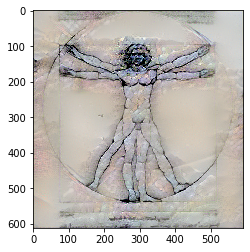

Image saved as style_transfer_result_at_iteration_19.png
Iteration 19 completed in 361s
Start of iteration 20
Current loss value: 73507760.0


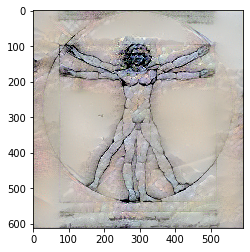

Image saved as style_transfer_result_at_iteration_20.png
Iteration 20 completed in 363s
Start of iteration 21
Current loss value: 70486750.0


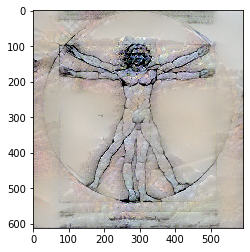

Image saved as style_transfer_result_at_iteration_21.png
Iteration 21 completed in 361s
Start of iteration 22
Current loss value: 67743680.0


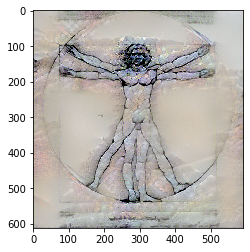

Image saved as style_transfer_result_at_iteration_22.png
Iteration 22 completed in 363s
Start of iteration 23
Current loss value: 65227160.0


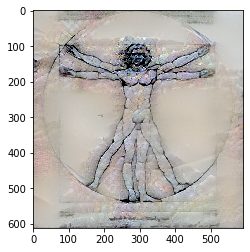

Image saved as style_transfer_result_at_iteration_23.png
Iteration 23 completed in 363s
Start of iteration 24
Current loss value: 62928180.0


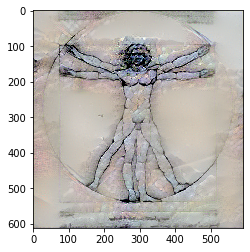

Image saved as style_transfer_result_at_iteration_24.png
Iteration 24 completed in 362s
Start of iteration 25
Current loss value: 60795890.0


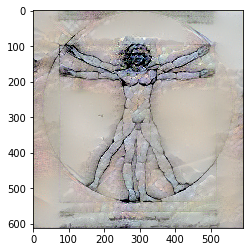

Image saved as style_transfer_result_at_iteration_25.png
Iteration 25 completed in 363s
Start of iteration 26
Current loss value: 58820184.0


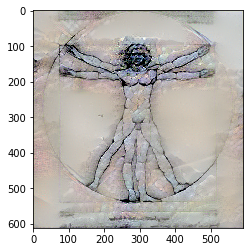

Image saved as style_transfer_result_at_iteration_26.png
Iteration 26 completed in 363s
Start of iteration 27
Current loss value: 56988244.0


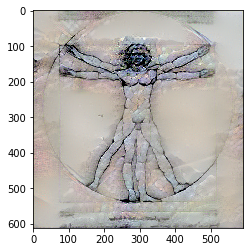

Image saved as style_transfer_result_at_iteration_27.png
Iteration 27 completed in 363s
Start of iteration 28
Current loss value: 55294060.0


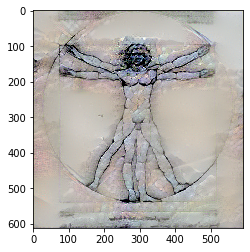

Image saved as style_transfer_result_at_iteration_28.png
Iteration 28 completed in 363s
Start of iteration 29
Current loss value: 53740810.0


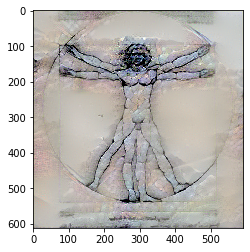

Image saved as style_transfer_result_at_iteration_29.png
Iteration 29 completed in 362s
Start of iteration 30
Current loss value: 52290430.0


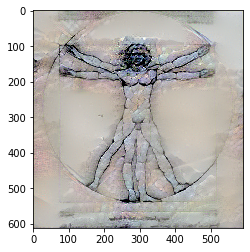

Image saved as style_transfer_result_at_iteration_30.png
Iteration 30 completed in 362s
Start of iteration 31
Current loss value: 50856284.0


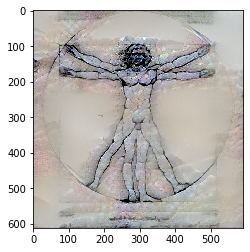

Image saved as style_transfer_result_at_iteration_31.png
Iteration 31 completed in 362s
Start of iteration 32
Current loss value: 49567132.0


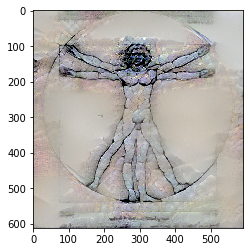

Image saved as style_transfer_result_at_iteration_32.png
Iteration 32 completed in 364s
Start of iteration 33
Current loss value: 48317296.0


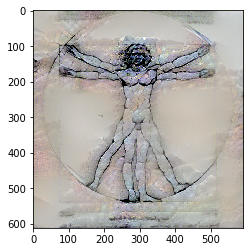

Image saved as style_transfer_result_at_iteration_33.png
Iteration 33 completed in 361s
Start of iteration 34
Current loss value: 47116476.0


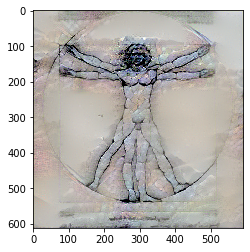

Image saved as style_transfer_result_at_iteration_34.png
Iteration 34 completed in 362s
Start of iteration 35
Current loss value: 46009584.0


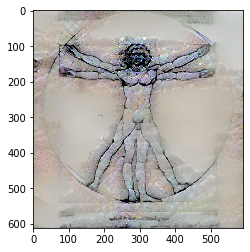

Image saved as style_transfer_result_at_iteration_35.png
Iteration 35 completed in 362s
Start of iteration 36
Current loss value: 44956068.0


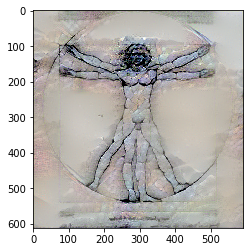

Image saved as style_transfer_result_at_iteration_36.png
Iteration 36 completed in 362s
Start of iteration 37
Current loss value: 43962870.0


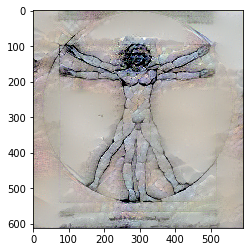

Image saved as style_transfer_result_at_iteration_37.png
Iteration 37 completed in 364s
Start of iteration 38
Current loss value: 43028160.0


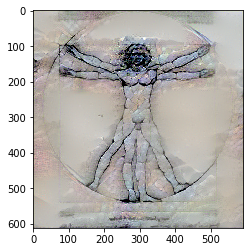

Image saved as style_transfer_result_at_iteration_38.png
Iteration 38 completed in 363s
Start of iteration 39
Current loss value: 42152344.0


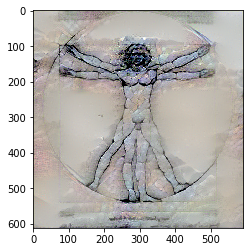

Image saved as style_transfer_result_at_iteration_39.png
Iteration 39 completed in 364s
Start of iteration 40
Current loss value: 41323428.0


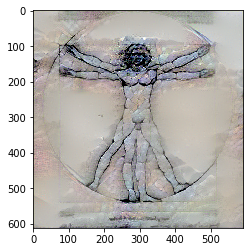

Image saved as style_transfer_result_at_iteration_40.png
Iteration 40 completed in 363s
Start of iteration 41
Current loss value: 40537764.0


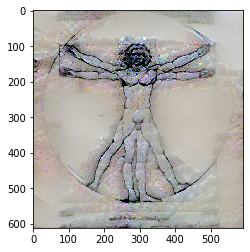

Image saved as style_transfer_result_at_iteration_41.png
Iteration 41 completed in 362s
Start of iteration 42
Current loss value: 39791696.0


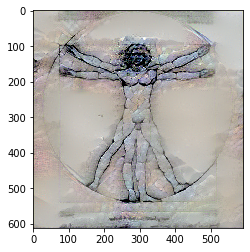

Image saved as style_transfer_result_at_iteration_42.png
Iteration 42 completed in 363s
Start of iteration 43
Current loss value: 39086892.0


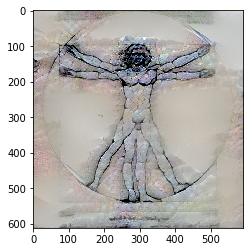

Image saved as style_transfer_result_at_iteration_43.png
Iteration 43 completed in 363s
Start of iteration 44
Current loss value: 38416420.0


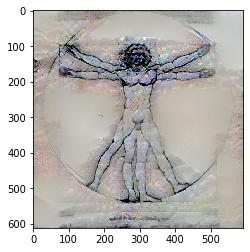

Image saved as style_transfer_result_at_iteration_44.png
Iteration 44 completed in 362s
Start of iteration 45
Current loss value: 37782388.0


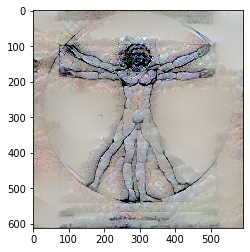

Image saved as style_transfer_result_at_iteration_45.png
Iteration 45 completed in 363s
Start of iteration 46
Current loss value: 37175576.0


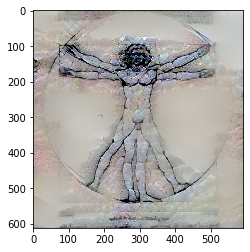

Image saved as style_transfer_result_at_iteration_46.png
Iteration 46 completed in 363s
Start of iteration 47
Current loss value: 36604390.0


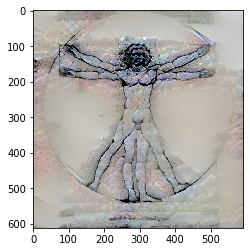

Image saved as style_transfer_result_at_iteration_47.png
Iteration 47 completed in 363s
Start of iteration 48
Current loss value: 36055576.0


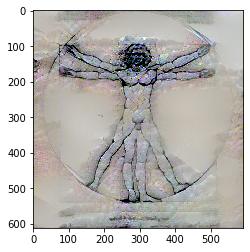

Image saved as style_transfer_result_at_iteration_48.png
Iteration 48 completed in 364s
Start of iteration 49
Current loss value: 35533096.0


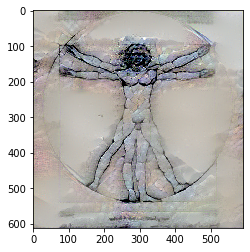

Image saved as style_transfer_result_at_iteration_49.png
Iteration 49 completed in 363s
Start of iteration 50
Current loss value: 35038164.0


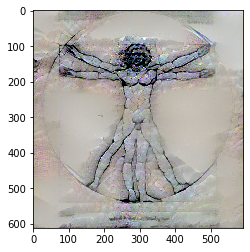

Image saved as style_transfer_result_at_iteration_50.png
Iteration 50 completed in 363s
Start of iteration 51
Current loss value: 34566910.0


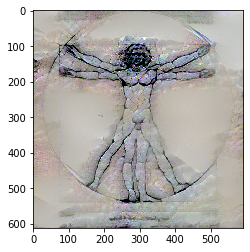

Image saved as style_transfer_result_at_iteration_51.png
Iteration 51 completed in 305s
Start of iteration 52
Current loss value: 34114744.0


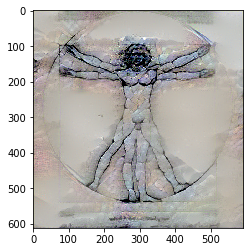

Image saved as style_transfer_result_at_iteration_52.png
Iteration 52 completed in 196s
Start of iteration 53
Current loss value: 33687244.0


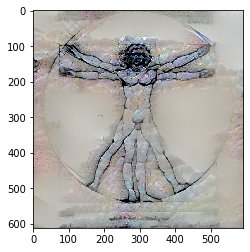

Image saved as style_transfer_result_at_iteration_53.png
Iteration 53 completed in 196s
Start of iteration 54
Current loss value: 33276744.0


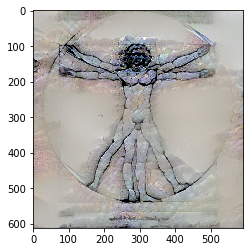

Image saved as style_transfer_result_at_iteration_54.png
Iteration 54 completed in 196s
Start of iteration 55
Current loss value: 32886324.0


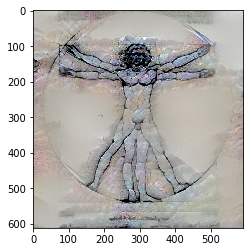

Image saved as style_transfer_result_at_iteration_55.png
Iteration 55 completed in 196s
Start of iteration 56
Current loss value: 32511300.0


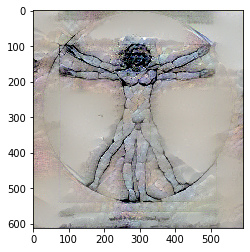

Image saved as style_transfer_result_at_iteration_56.png
Iteration 56 completed in 195s
Start of iteration 57
Current loss value: 32151290.0


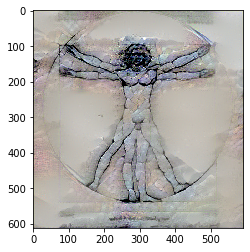

Image saved as style_transfer_result_at_iteration_57.png
Iteration 57 completed in 196s
Start of iteration 58
Current loss value: 31808092.0


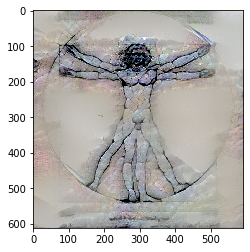

Image saved as style_transfer_result_at_iteration_58.png
Iteration 58 completed in 195s
Start of iteration 59
Current loss value: 31478920.0


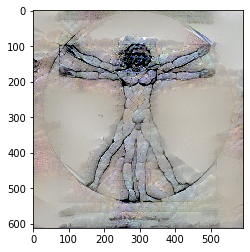

Image saved as style_transfer_result_at_iteration_59.png
Iteration 59 completed in 195s
Start of iteration 60
Current loss value: 31166092.0


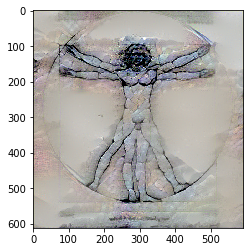

Image saved as style_transfer_result_at_iteration_60.png
Iteration 60 completed in 195s
Start of iteration 61
Current loss value: 30864700.0


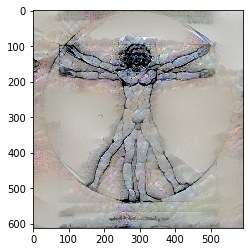

Image saved as style_transfer_result_at_iteration_61.png
Iteration 61 completed in 196s
Start of iteration 62
Current loss value: 30575184.0


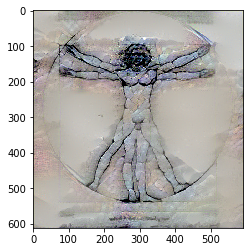

Image saved as style_transfer_result_at_iteration_62.png
Iteration 62 completed in 196s
Start of iteration 63
Current loss value: 30293420.0


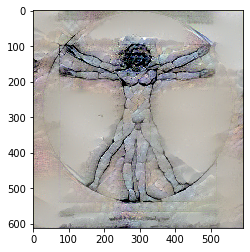

Image saved as style_transfer_result_at_iteration_63.png
Iteration 63 completed in 196s
Start of iteration 64
Current loss value: 30022562.0


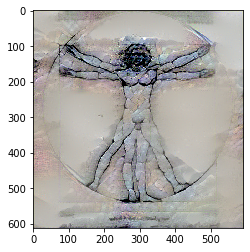

Image saved as style_transfer_result_at_iteration_64.png
Iteration 64 completed in 196s
Start of iteration 65
Current loss value: 29760676.0


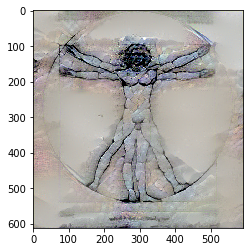

Image saved as style_transfer_result_at_iteration_65.png
Iteration 65 completed in 196s
Start of iteration 66
Current loss value: 29506866.0


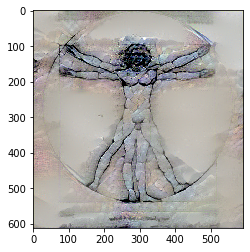

Image saved as style_transfer_result_at_iteration_66.png
Iteration 66 completed in 197s
Start of iteration 67
Current loss value: 29262962.0


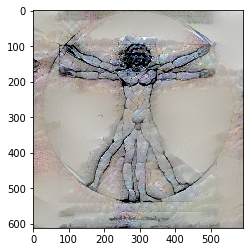

Image saved as style_transfer_result_at_iteration_67.png
Iteration 67 completed in 196s
Start of iteration 68
Current loss value: 29029606.0


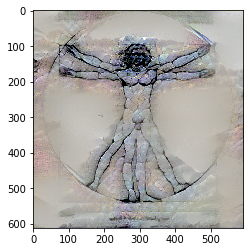

Image saved as style_transfer_result_at_iteration_68.png
Iteration 68 completed in 197s
Start of iteration 69
Current loss value: 28803440.0


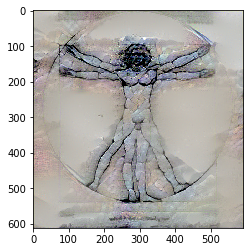

Image saved as style_transfer_result_at_iteration_69.png
Iteration 69 completed in 196s
Start of iteration 70
Current loss value: 28583890.0


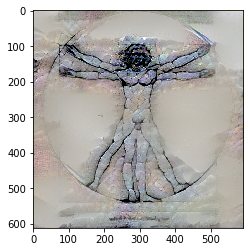

Image saved as style_transfer_result_at_iteration_70.png
Iteration 70 completed in 197s
Start of iteration 71
Current loss value: 28370172.0


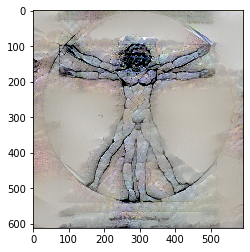

Image saved as style_transfer_result_at_iteration_71.png
Iteration 71 completed in 197s
Start of iteration 72
Current loss value: 28164968.0


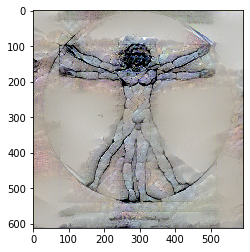

Image saved as style_transfer_result_at_iteration_72.png
Iteration 72 completed in 196s
Start of iteration 73
Current loss value: 27963056.0


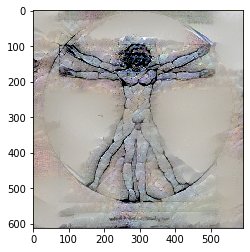

Image saved as style_transfer_result_at_iteration_73.png
Iteration 73 completed in 197s
Start of iteration 74
Current loss value: 27767844.0


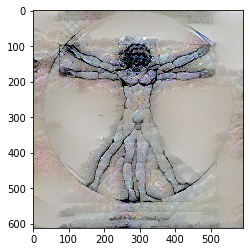

Image saved as style_transfer_result_at_iteration_74.png
Iteration 74 completed in 196s
Start of iteration 75
Current loss value: 27578614.0


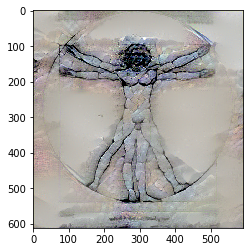

Image saved as style_transfer_result_at_iteration_75.png
Iteration 75 completed in 196s
Start of iteration 76
Current loss value: 27394084.0


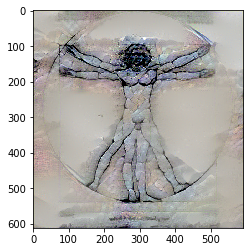

Image saved as style_transfer_result_at_iteration_76.png
Iteration 76 completed in 196s
Start of iteration 77
Current loss value: 27215184.0


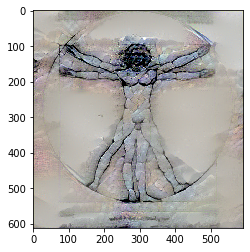

Image saved as style_transfer_result_at_iteration_77.png
Iteration 77 completed in 196s
Start of iteration 78
Current loss value: 27042254.0


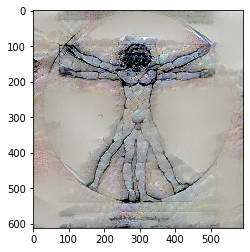

Image saved as style_transfer_result_at_iteration_78.png
Iteration 78 completed in 196s
Start of iteration 79
Current loss value: 26874122.0


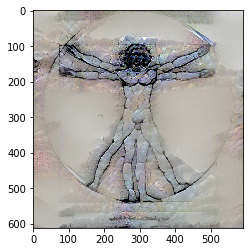

Image saved as style_transfer_result_at_iteration_79.png
Iteration 79 completed in 197s
Start of iteration 80
Current loss value: 26712980.0


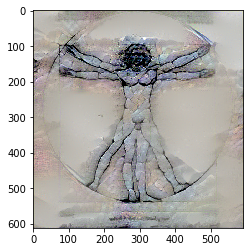

Image saved as style_transfer_result_at_iteration_80.png
Iteration 80 completed in 196s
Start of iteration 81
Current loss value: 26553252.0


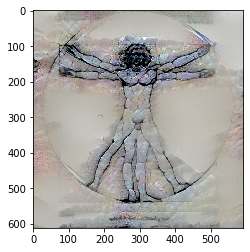

Image saved as style_transfer_result_at_iteration_81.png
Iteration 81 completed in 196s
Start of iteration 82
Current loss value: 26400040.0


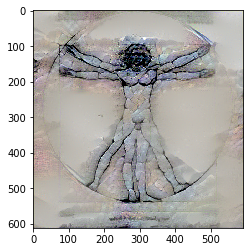

Image saved as style_transfer_result_at_iteration_82.png
Iteration 82 completed in 196s
Start of iteration 83
Current loss value: 26248768.0


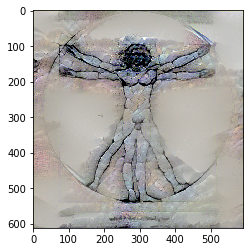

Image saved as style_transfer_result_at_iteration_83.png
Iteration 83 completed in 195s
Start of iteration 84
Current loss value: 26103940.0


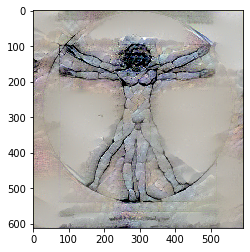

Image saved as style_transfer_result_at_iteration_84.png
Iteration 84 completed in 196s
Start of iteration 85
Current loss value: 25960948.0


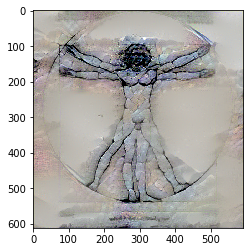

Image saved as style_transfer_result_at_iteration_85.png
Iteration 85 completed in 196s
Start of iteration 86
Current loss value: 25824022.0


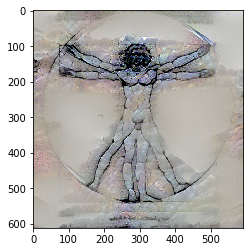

Image saved as style_transfer_result_at_iteration_86.png
Iteration 86 completed in 196s
Start of iteration 87
Current loss value: 25688610.0


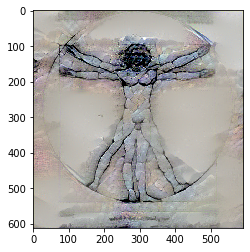

Image saved as style_transfer_result_at_iteration_87.png
Iteration 87 completed in 196s
Start of iteration 88
Current loss value: 25558932.0


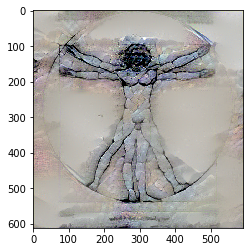

Image saved as style_transfer_result_at_iteration_88.png
Iteration 88 completed in 197s
Start of iteration 89
Current loss value: 25428116.0


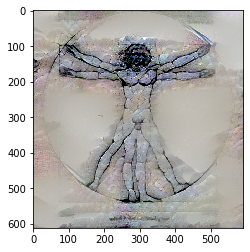

Image saved as style_transfer_result_at_iteration_89.png
Iteration 89 completed in 196s
Start of iteration 90
Current loss value: 25301292.0


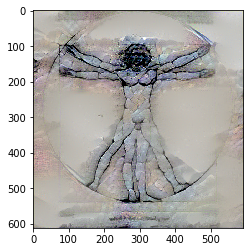

Image saved as style_transfer_result_at_iteration_90.png
Iteration 90 completed in 197s
Start of iteration 91
Current loss value: 25175648.0


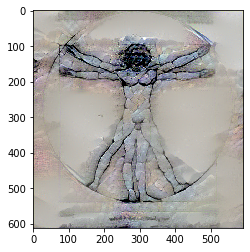

Image saved as style_transfer_result_at_iteration_91.png
Iteration 91 completed in 196s
Start of iteration 92
Current loss value: 25055050.0


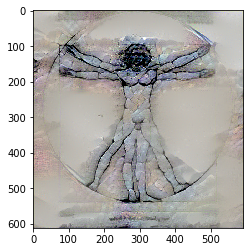

Image saved as style_transfer_result_at_iteration_92.png
Iteration 92 completed in 197s
Start of iteration 93
Current loss value: 24933526.0


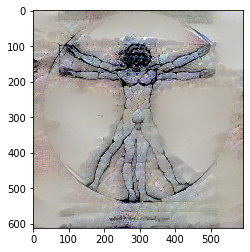

Image saved as style_transfer_result_at_iteration_93.png
Iteration 93 completed in 197s
Start of iteration 94
Current loss value: 24818012.0


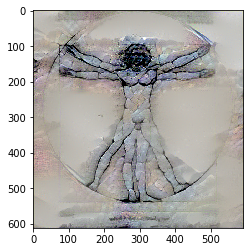

Image saved as style_transfer_result_at_iteration_94.png
Iteration 94 completed in 196s
Start of iteration 95
Current loss value: 24702706.0


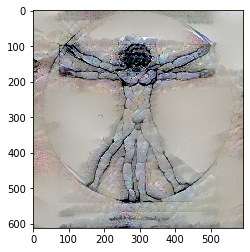

Image saved as style_transfer_result_at_iteration_95.png
Iteration 95 completed in 197s
Start of iteration 96
Current loss value: 24592102.0


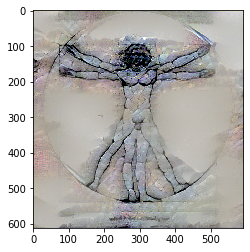

Image saved as style_transfer_result_at_iteration_96.png
Iteration 96 completed in 197s
Start of iteration 97
Current loss value: 24481538.0


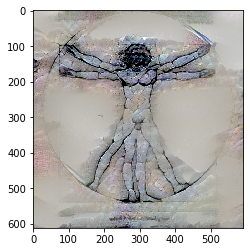

Image saved as style_transfer_result_at_iteration_97.png
Iteration 97 completed in 196s
Start of iteration 98
Current loss value: 24375644.0


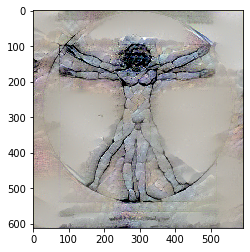

Image saved as style_transfer_result_at_iteration_98.png
Iteration 98 completed in 196s
Start of iteration 99
Current loss value: 24271338.0


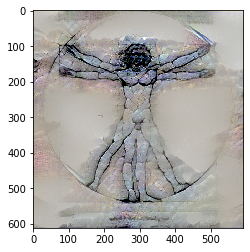

Image saved as style_transfer_result_at_iteration_99.png
Iteration 99 completed in 197s


In [30]:
from scipy.optimize import fmin_l_bfgs_b
#from scipy.misc import imsave
from matplotlib import pyplot as plt
import time


result_prefix = 'style_transfer_result'
iterations = 100

lv = []

# Run scipy-based optimization (L-BFGS) over the pixels of the generated image
# so as to minimize the neural style loss.
# This is our initial state: the target image.
# Note that `scipy.optimize.fmin_l_bfgs_b` can only process flat vectors.
x = preprocess_image(target_image_path)
x = x.flatten()
for i in range(iterations):
    print('Start of iteration', i)
    start_time = time.time()
    x, min_val, info = fmin_l_bfgs_b(evaluator.loss, x,
                                     fprime=evaluator.grads, maxfun=20)
    
    lv.append(min_val)
    print('Current loss value:', min_val)
    # Save current generated image
    img = x.copy().reshape((img_height, img_width, 3))
    img = deprocess_image(img)
    fname = result_prefix + '_at_iteration_%d.png' % i
    
    plt.imshow(img)
    #plt.savefig(fname)
    plt.show()
    
    cvimg = img[:,:,::-1]
    cv2.imwrite (fname,cvimg)
    
    #imsave(fname, img)
    end_time = time.time()
    print('Image saved as', fname)
    print('Iteration %d completed in %ds' % (i, end_time - start_time))

Here's what we get:

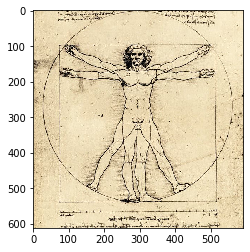

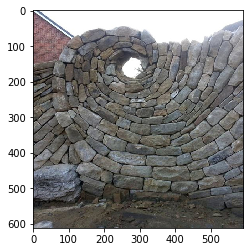

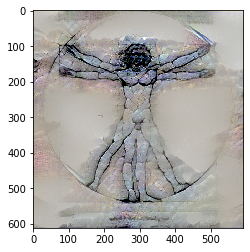

In [31]:
from matplotlib import pyplot as plt

# Content image
plt.imshow(load_img(target_image_path, target_size=(img_height, img_width)))
plt.figure()

# Style image
plt.imshow(load_img(style_reference_image_path, target_size=(img_height, img_width)))
plt.figure()

# Generate image
plt.imshow(img)
plt.show()


Keep in mind that what this technique achieves is merely a form of image re-texturing, or texture transfer. It will work best with style 
reference images that are strongly textured and highly self-similar, and with content targets that don't require high levels of details in 
order to be recognizable. It would typically not be able to achieve fairly abstract feats such as "transferring the style of one portrait to 
another". The algorithm is closer to classical signal processing than to AI, so don't expect it to work like magic!

Additionally, do note that running this style transfer algorithm is quite slow. However, the transformation operated by our setup is simple 
enough that it can be learned by a small, fast feedforward convnet as well -- as long as you have appropriate training data available. Fast 
style transfer can thus be achieved by first spending a lot of compute cycles to generate input-output training examples for a fixed style 
reference image, using the above method, and then training a simple convnet to learn this style-specific transformation. Once that is done, 
stylizing a given image is instantaneous: it's a just a forward pass of this small convnet.


## Take aways

* Style transfer consists in creating a new image that preserves the "contents" of a target image while also capturing the "style" of a 
reference image.
* "Content" can be captured by the high-level activations of a convnet.
* "Style" can be captured by the internal correlations of the activations of different layers of a convnet.
* Hence deep learning allows style transfer to be formulated as an optimization process using a loss defined with a pre-trained convnet.
* Starting from this basic idea, many variants and refinements are possible!


In [32]:
print(lv)

[1441418100.0, 642476200.0, 419749760.0, 321995800.0, 263278820.0, 223134740.0, 194723550.0, 173359760.0, 156441860.0, 142405070.0, 131009350.0, 121496540.0, 113236584.0, 106059256.0, 99616200.0, 93951460.0, 88952136.0, 84438200.0, 80405310.0, 76772260.0, 73507760.0, 70486750.0, 67743680.0, 65227160.0, 62928180.0, 60795890.0, 58820184.0, 56988244.0, 55294060.0, 53740810.0, 52290430.0, 50856284.0, 49567132.0, 48317296.0, 47116476.0, 46009584.0, 44956068.0, 43962870.0, 43028160.0, 42152344.0, 41323428.0, 40537764.0, 39791696.0, 39086892.0, 38416420.0, 37782388.0, 37175576.0, 36604390.0, 36055576.0, 35533096.0, 35038164.0, 34566910.0, 34114744.0, 33687244.0, 33276744.0, 32886324.0, 32511300.0, 32151290.0, 31808092.0, 31478920.0, 31166092.0, 30864700.0, 30575184.0, 30293420.0, 30022562.0, 29760676.0, 29506866.0, 29262962.0, 29029606.0, 28803440.0, 28583890.0, 28370172.0, 28164968.0, 27963056.0, 27767844.0, 27578614.0, 27394084.0, 27215184.0, 27042254.0, 26874122.0, 26712980.0, 26553252.0, 

In [34]:
lv

[1441418100.0,
 642476200.0,
 419749760.0,
 321995800.0,
 263278820.0,
 223134740.0,
 194723550.0,
 173359760.0,
 156441860.0,
 142405070.0,
 131009350.0,
 121496540.0,
 113236584.0,
 106059256.0,
 99616200.0,
 93951460.0,
 88952136.0,
 84438200.0,
 80405310.0,
 76772260.0,
 73507760.0,
 70486750.0,
 67743680.0,
 65227160.0,
 62928180.0,
 60795890.0,
 58820184.0,
 56988244.0,
 55294060.0,
 53740810.0,
 52290430.0,
 50856284.0,
 49567132.0,
 48317296.0,
 47116476.0,
 46009584.0,
 44956068.0,
 43962870.0,
 43028160.0,
 42152344.0,
 41323428.0,
 40537764.0,
 39791696.0,
 39086892.0,
 38416420.0,
 37782388.0,
 37175576.0,
 36604390.0,
 36055576.0,
 35533096.0,
 35038164.0,
 34566910.0,
 34114744.0,
 33687244.0,
 33276744.0,
 32886324.0,
 32511300.0,
 32151290.0,
 31808092.0,
 31478920.0,
 31166092.0,
 30864700.0,
 30575184.0,
 30293420.0,
 30022562.0,
 29760676.0,
 29506866.0,
 29262962.0,
 29029606.0,
 28803440.0,
 28583890.0,
 28370172.0,
 28164968.0,
 27963056.0,
 27767844.0,
 27578614.